In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import time

# Data Preprocessing
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

dataset = datasets.OxfordIIITPet(root='./data', download=True, transform=transform_train)
test_dataset = datasets.OxfordIIITPet(root='./data', split='test', download=True, transform=transform_test)

# Split dataset into train, val, test
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Model Selection and Architecture
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 37)  # 37 classes in OxfordIIITPet dataset

# Move model to GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=25):
    since = time.time()
    best_model_wts = model.state_dict()
    best_acc = 0.0

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                loader = train_loader
            else:
                model.eval()
                loader = val_loader

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in loader:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(loader.dataset)
            epoch_acc = running_corrects.double() / len(loader.dataset)

            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc.item())
            else:
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc.item())

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    model.load_state_dict(best_model_wts)
    return model, history

model, history = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=25)
def evaluate_model(model, loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')

# Evaluate the model on the validation set
evaluate_model(model, val_loader)

# Final Model Testing
evaluate_model(model, test_loader)


100%|██████████| 791918971/791918971 [00:21<00:00, 36524536.48it/s]


Extracting data/oxford-iiit-pet/images.tar.gz to data/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:01<00:00, 16490360.75it/s]


Extracting data/oxford-iiit-pet/annotations.tar.gz to data/oxford-iiit-pet


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 125MB/s]


Epoch 0/24
----------
train Loss: 2.8305 Acc: 0.3254
val Loss: 1.7322 Acc: 0.6440

Epoch 1/24
----------
train Loss: 1.4518 Acc: 0.7035
val Loss: 1.0372 Acc: 0.7785

Epoch 2/24
----------
train Loss: 0.9802 Acc: 0.7870
val Loss: 0.8165 Acc: 0.8003

Epoch 3/24
----------
train Loss: 0.8054 Acc: 0.8006
val Loss: 0.7352 Acc: 0.7935

Epoch 4/24
----------
train Loss: 0.6879 Acc: 0.8308
val Loss: 0.6625 Acc: 0.8193

Epoch 5/24
----------
train Loss: 0.6206 Acc: 0.8329
val Loss: 0.6107 Acc: 0.8410

Epoch 6/24
----------
train Loss: 0.5850 Acc: 0.8482
val Loss: 0.6205 Acc: 0.8193

Epoch 7/24
----------
train Loss: 0.5387 Acc: 0.8618
val Loss: 0.5228 Acc: 0.8315

Epoch 8/24
----------
train Loss: 0.5134 Acc: 0.8621
val Loss: 0.5863 Acc: 0.8288

Epoch 9/24
----------
train Loss: 0.4782 Acc: 0.8730
val Loss: 0.5671 Acc: 0.8234

Epoch 10/24
----------
train Loss: 0.4520 Acc: 0.8862
val Loss: 0.5491 Acc: 0.8247

Epoch 11/24
----------
train Loss: 0.4471 Acc: 0.8781
val Loss: 0.5453 Acc: 0.8302

Ep

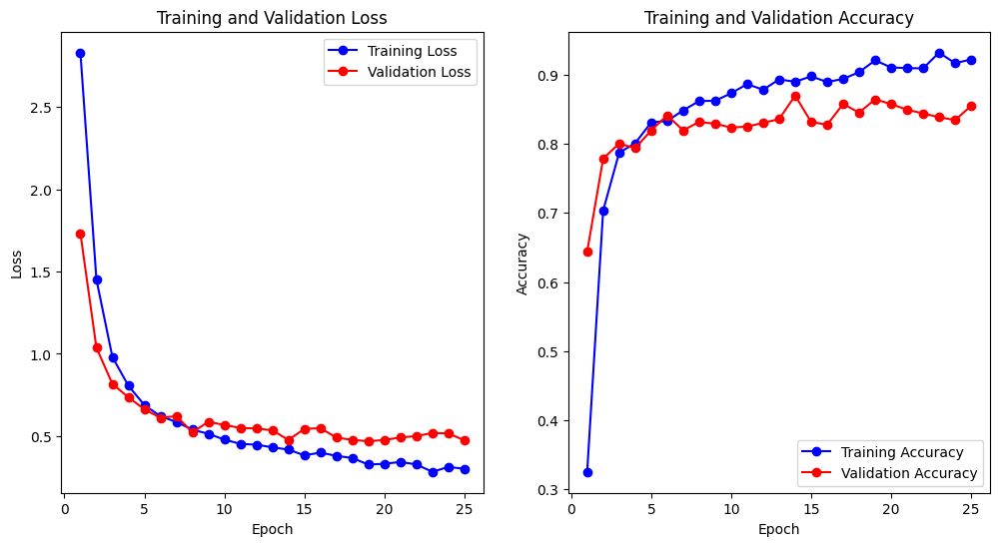

In [3]:
def plot_training_curves(history):
    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(12, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], 'bo-', label='Training Loss')
    plt.plot(epochs, history['val_loss'], 'ro-', label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_acc'], 'bo-', label='Training Accuracy')
    plt.plot(epochs, history['val_acc'], 'ro-', label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

# Plot the training and validation curves
plot_training_curves(history)


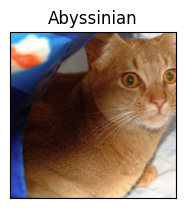

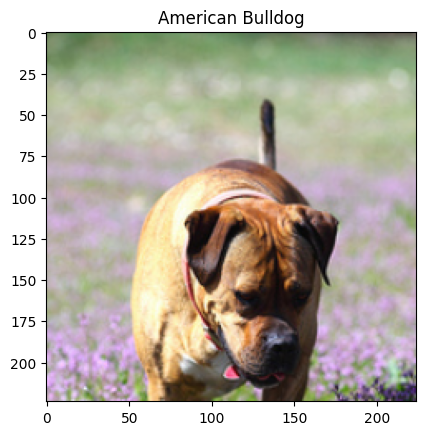

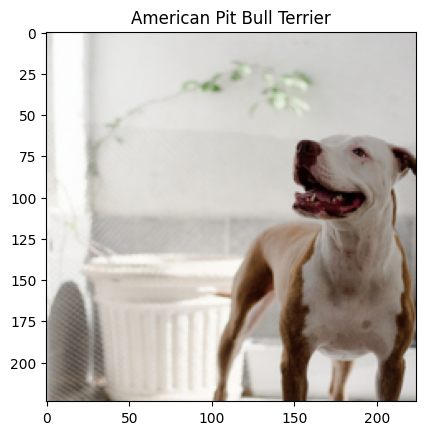

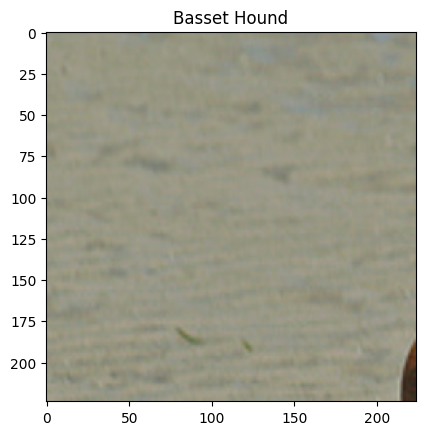

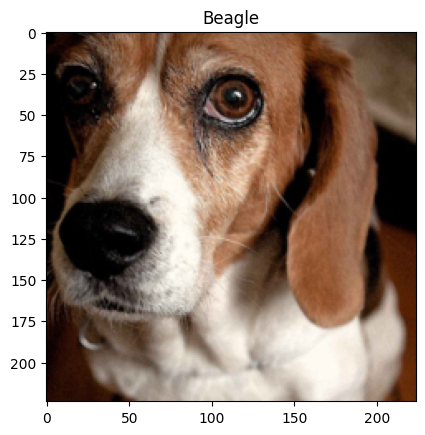

...

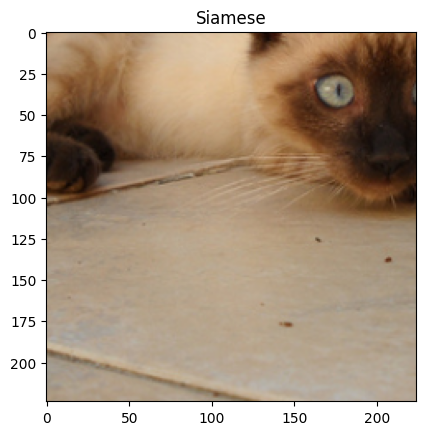

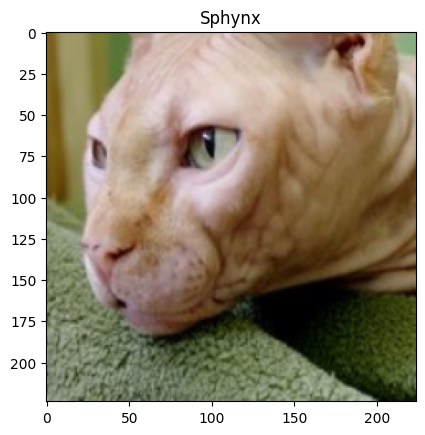

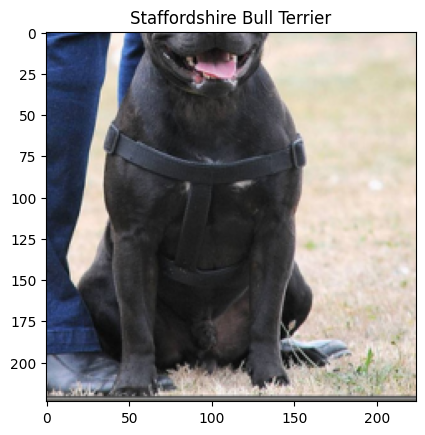

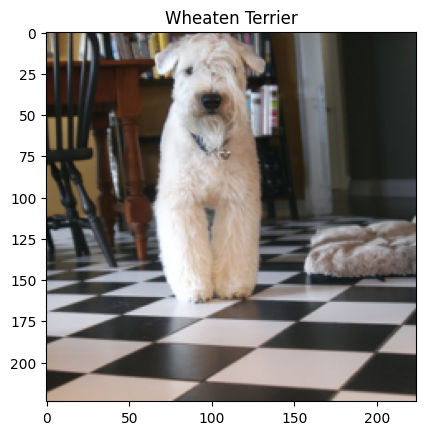

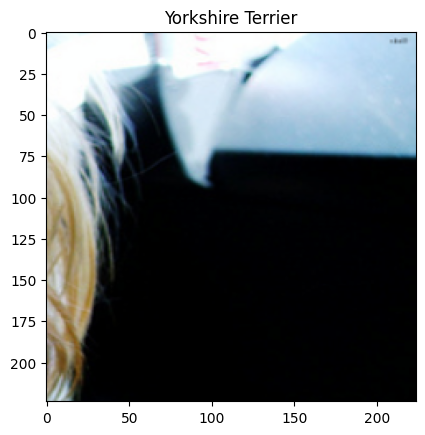

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def collect_one_image_per_class(dataset, class_names):
    class_images = {}
    class_indices = {class_name: idx for idx, class_name in enumerate(class_names)}

    for img, label in dataset:
        class_name = class_names[label]
        if class_name not in class_images:
            class_images[class_name] = img
        if len(class_images) == len(class_names):
            break
    return class_images

def show_images_per_class(class_images):
    num_classes = len(class_images)
    cols = 6
    rows = (num_classes + cols - 1) // cols  # Calculate rows needed for grid layout
    fig = plt.figure(figsize=(15, rows * 3))

    for i, (class_name, img) in enumerate(class_images.items()):
        ax = fig.add_subplot(rows, cols, i + 1, xticks=[], yticks=[])
        imshow(img, title=class_name)

    plt.show()

# Get the class names from the dataset
class_names = dataset.classes

# Collect one image per class from the train dataset
class_images = collect_one_image_per_class(dataset, class_names)

# Display these images
show_images_per_class(class_images)
